# 딥러닝 영상 처리 기본
* OpenCV 사용하기

# Lecture 1
* OpenCV 소개    
* Raster Graphics: bitmap graphics     
* Vector Graphics: .xcg, ....     

# Lecture 2 
* OpenCV 이미지 처리 
* im_show
* matplotlib
* PIL.Image

1. File upload

In [3]:
from google.colab import files
upload_file = files.upload()

Saving car1.jpg to car1.jpg


2. import Modules

In [4]:
import cv2
import numpy as np

In [5]:
print("OpenCV version: ", cv2.__version__)

OpenCV version:  4.1.2


3. Read image

* cv2.imread()   
* cv2.imshow() $→$ Not available at Colab

In [6]:
img = cv2.imread('car1.jpg')

In [ ]:
cv2.imshow('My Car', img)

In [7]:
!ls -al

total 96
drwxr-xr-x 1 root root  4096 Jan  6 01:12 .
drwxr-xr-x 1 root root  4096 Jan  6 00:47 ..
-rw-r--r-- 1 root root 77963 Jan  6 01:12 car1.jpg
drwxr-xr-x 4 root root  4096 Dec 23 14:32 .config
drwxr-xr-x 1 root root  4096 Dec 23 14:32 sample_data


4. 3 ways to show image

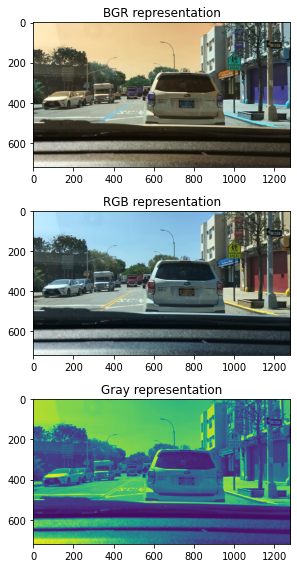

In [13]:
# Solution 1: Matplotlib 
import matplotlib.pyplot as plt

rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #BGR to RGB
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # 흑백 사진으로 변경

fig, axes = plt.subplots(3,1, figsize= (8,8))

axes[0].imshow(img)
axes[0].set_title("BGR representation")

axes[1].imshow(rgb_img)
axes[1].set_title("RGB representation")

axes[2].imshow(gray)
axes[2].set_title("Gray representation")

plt.tight_layout()
plt.show()

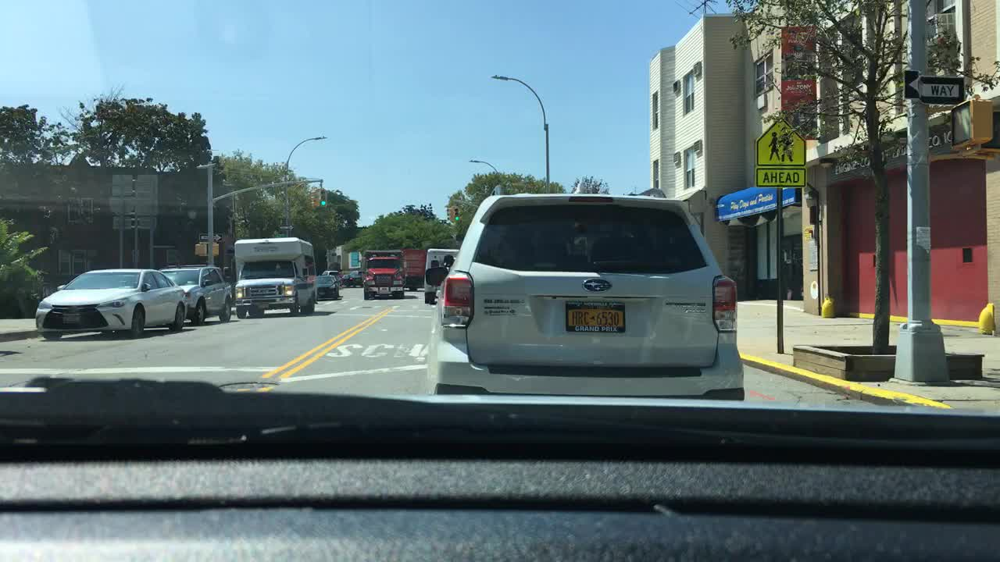

width: 1280 pixels
height: 720 pixels
channels: 3 pixels


In [14]:
# Solution 2: Colab
from google.colab.patches import cv2_imshow
cv2_imshow(img)
# no need to convert BGR to RGB

print(f"width: {img.shape[1]} pixels")
print(f"height: {img.shape[0]} pixels")
print(f"channels: {img.shape[2]} pixels")

In [15]:
img.shape

(720, 1280, 3)

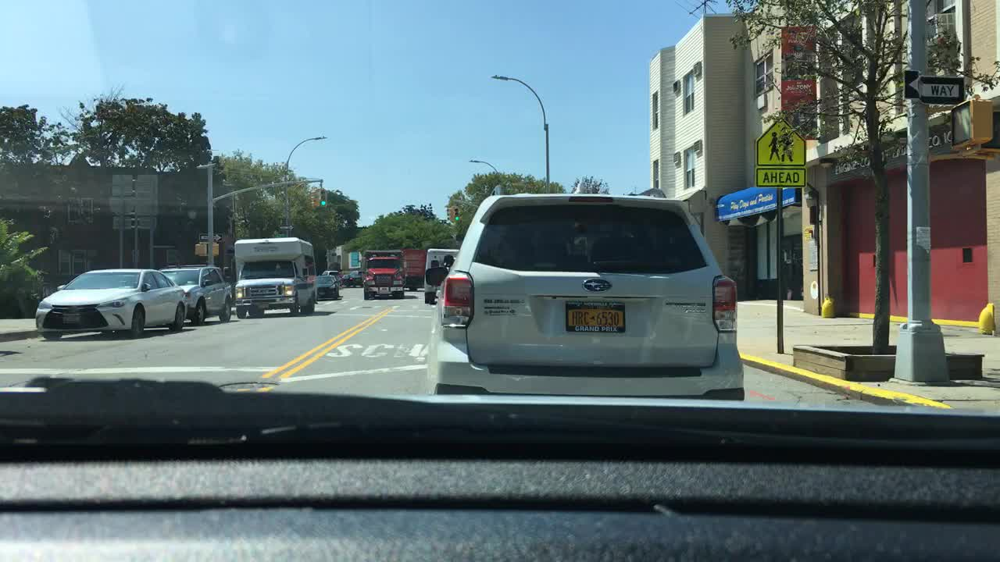

In [16]:
# Solution 3: PIL 
import PIL.Image as Image
Image.fromarray(rgb_img)

# Lecture 3    
* 이미지에 도형과 글씨를 그리기

1. File upload

In [18]:
from google.colab import files
upload_file = files.upload()

Saving car1.jpg to car1 (1).jpg


2. Laod File

In [19]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [20]:
print("OpenCV version, ", cv2.__version__)

OpenCV version,  4.1.2


In [21]:
!ls -al

total 176
drwxr-xr-x 1 root root  4096 Jan  6 01:28  .
drwxr-xr-x 1 root root  4096 Jan  6 00:47  ..
-rw-r--r-- 1 root root 77963 Jan  6 01:28 'car1 (1).jpg'
-rw-r--r-- 1 root root 77963 Jan  6 01:12  car1.jpg
drwxr-xr-x 4 root root  4096 Dec 23 14:32  .config
drwxr-xr-x 1 root root  4096 Dec 23 14:32  sample_data


In [22]:
img = cv2.imread('./car1.jpg')

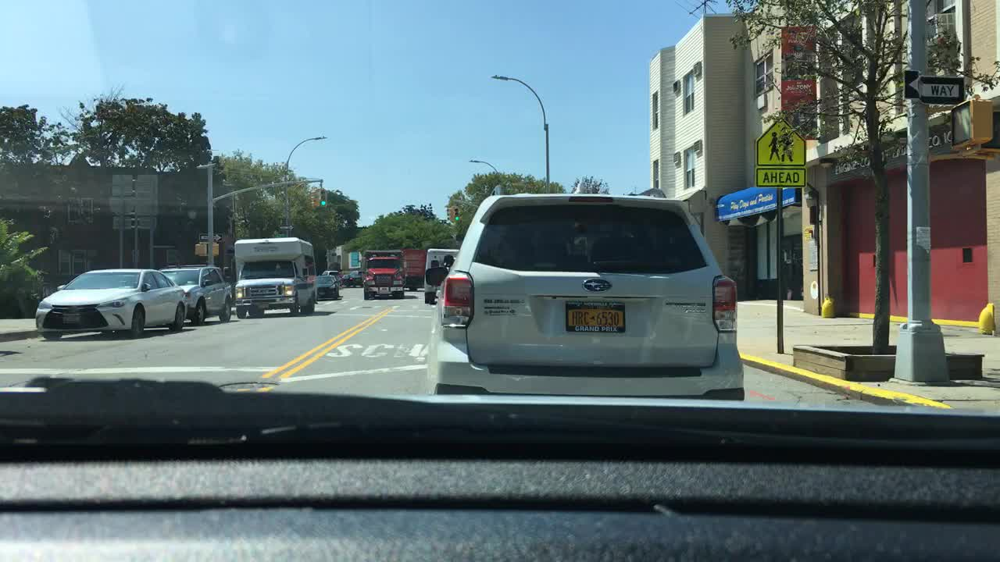

height: 720
width: 1280
channel: 3


In [24]:
cv2_imshow(img) 
print(f'height: {img.shape[0]}')
print(f'width: {img.shape[1]}')
print(f'channel: {img.shape[2]}')

In [38]:
X = 250 #@param {type: "slider", min: 0, max: 1280, step:1}
Y = 68 #@param {type: "slider", min: 0, max: 720, step: 1}
SIZE = 100 #@param {type: "slider", min: 0, max: 200, step: 1}

In [33]:
(b,g,r) = img[Y, X] # height, width
print(f"Pixel at ({X}, {Y}) - Red: {r}, Green: {g}, Blue: {b}")

Pixel at (679, 246) - Red: 60, Green: 85, Blue: 64


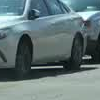

In [39]:
# Crop cordination = image[y:y+h, x:x+w]
cropped = img[Y:Y+100,X:X+100]
cv2_imshow(cropped)

In [47]:
img[Y:Y+100,X:X+100] = (0, 0, 255)

In [ ]:
# rectangle
cv2.rectangle(img, (X+SIZE*2, Y), (X+SIZE*3, Y+SIZE), (0, 255, 0), 5) # (r,g,b), thickness

In [ ]:
# circle
radius = int(SIZE/2)
cv2.circle(img, (X+SIZE*4, Y+radius), radius, (255,255,0), -1) # -1 = fill 

In [ ]:
# line
cv2.line(img, (X+SIZE*5, Y), (X+SIZE*6, Y+SIZE), (0,255,255), 5)

In [ ]:
# text
cv2.putText(img, 'creApple', (X+SIZE*7, Y+SIZE), cv2.FONT_HERSHEY_COMPLEX, 1, (255,0,0))

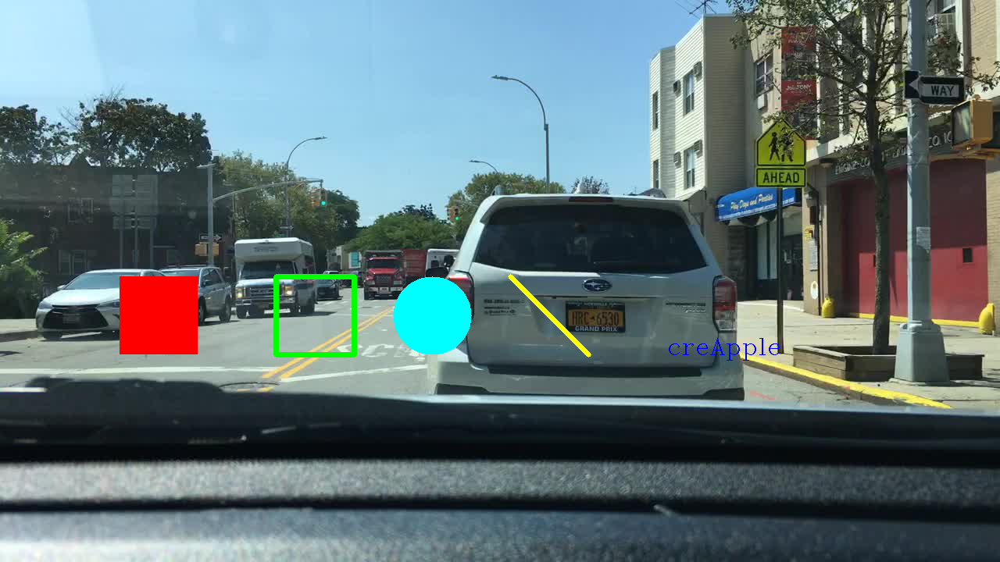

In [48]:
cv2_imshow(img)

In [49]:
# save the image
cv2.imwrite('car-copy.jpg', img)

True

In [50]:
!ls -al

total 356
drwxr-xr-x 1 root root   4096 Jan  6 02:12  .
drwxr-xr-x 1 root root   4096 Jan  6 00:47  ..
-rw-r--r-- 1 root root  77963 Jan  6 01:28 'car1 (1).jpg'
-rw-r--r-- 1 root root  77963 Jan  6 01:12  car1.jpg
-rw-r--r-- 1 root root 184188 Jan  6 02:12  car-copy.jpg
drwxr-xr-x 4 root root   4096 Dec 23 14:32  .config
drwxr-xr-x 1 root root   4096 Dec 23 14:32  sample_data


In [63]:
def donwload(path):
    try:
        from google.colab import files
        files.download(path)
    except:
        import os
        print('Error download: ', os.path.join(os.getcwd(), path))

In [64]:
donwload('car-copy.jpg')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Lecture 4
* 이미지를 다양한 형태로 변형하기

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab import files
from google.colab.patches import cv2_imshow

In [4]:
print(f'OpenCV version: {cv2.__version__}')

OpenCV version: 4.1.2


In [5]:
uploaded_file = files.upload()

Saving car1.jpg to car1.jpg


In [ ]:
uploaded_file

In [8]:
!ls -al

total 96
drwxr-xr-x 1 root root  4096 Jan  6 02:29 .
drwxr-xr-x 1 root root  4096 Jan  6 02:26 ..
-rw-r--r-- 1 root root 77963 Jan  6 02:29 car1.jpg
drwxr-xr-x 4 root root  4096 Dec 23 14:32 .config
drwxr-xr-x 1 root root  4096 Dec 23 14:32 sample_data


In [9]:
img = cv2.imread('car1.jpg')

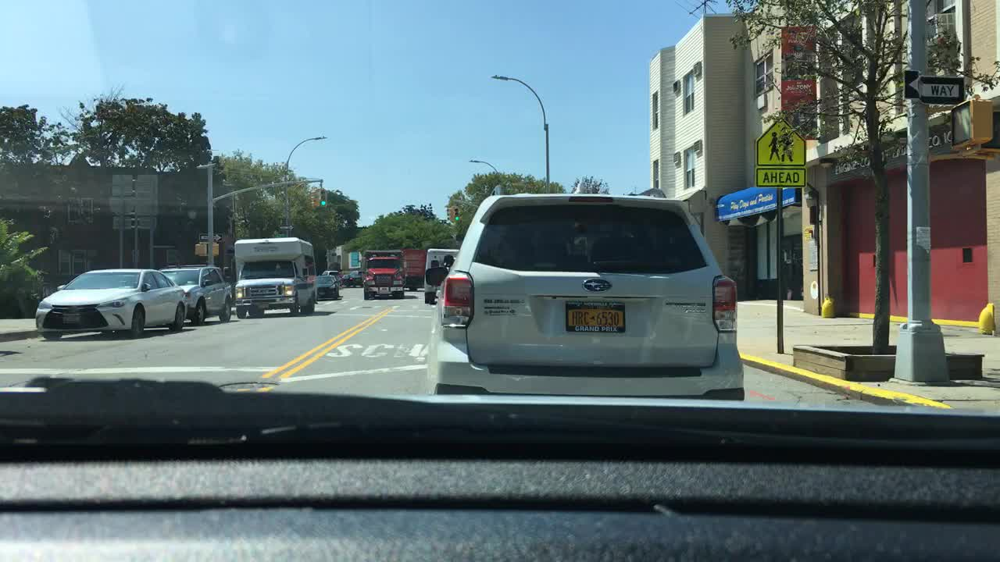

width: 1280 pixels
height: 720 pixels
channels: 3 pixels
720 1280 (640, 360)


In [17]:
cv2_imshow(img)
print(f'width: {img.shape[1]} pixels')
print(f'height: {img.shape[0]} pixels')
print(f'channels: {img.shape[2]} pixels')

height, width = img.shape[:2]
center = (width//2, height//2)

print(height, width, center)

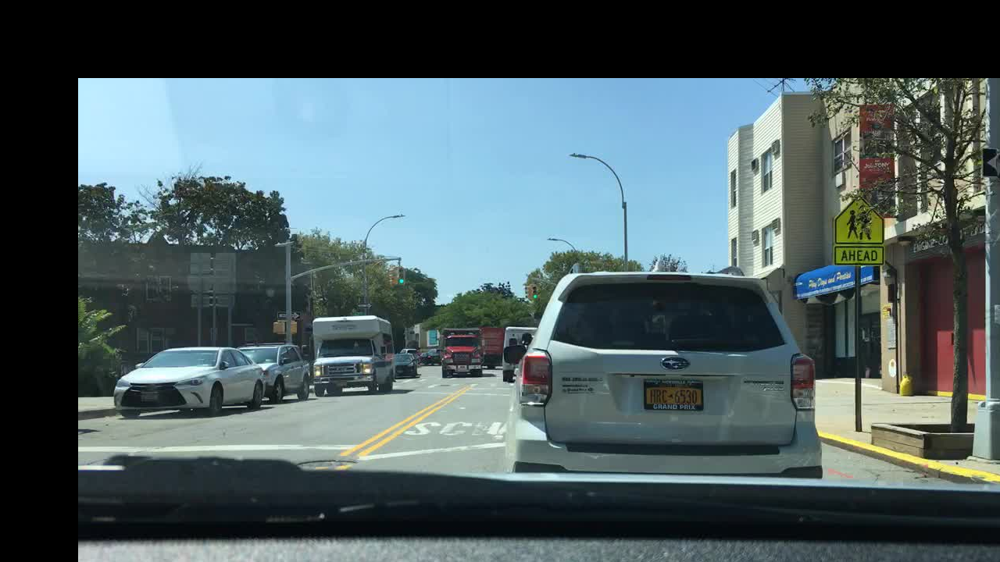

In [18]:
# move image
# Moved down: +, up: - and right: +, left -
move = np.float32([[1,0,100],[0,1,100]])
# right: 100
# down: 100
moved = cv2.warpAffine(img, move, (width, height))
cv2_imshow(moved)

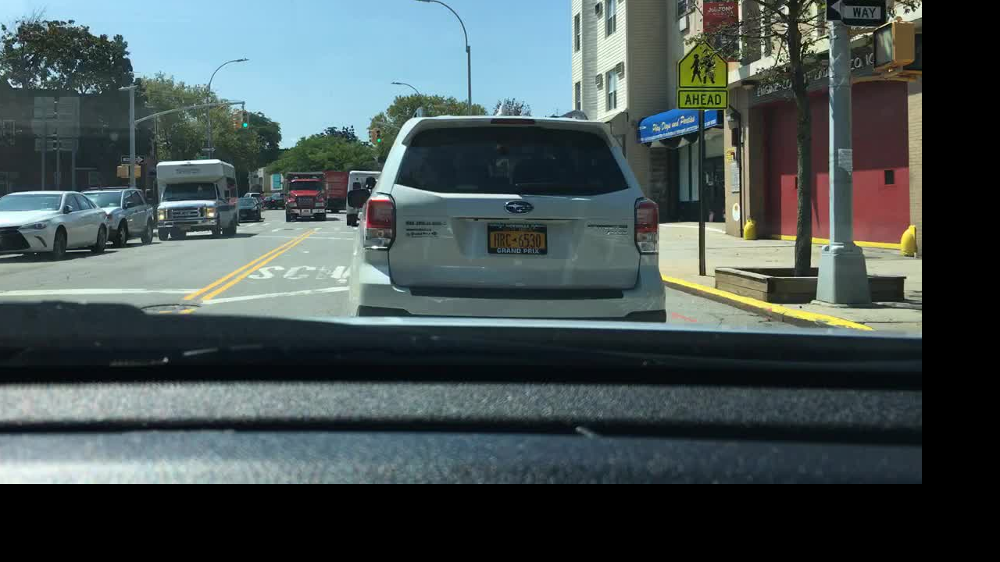

In [21]:
# move image
# Moved down: +, up: - and right: +, left -
move = np.float32([[1,0,-100],[0,1,-100]])
# left: 100
# up: 100
moved = cv2.warpAffine(img, move, (width, height))
cv2_imshow(moved)

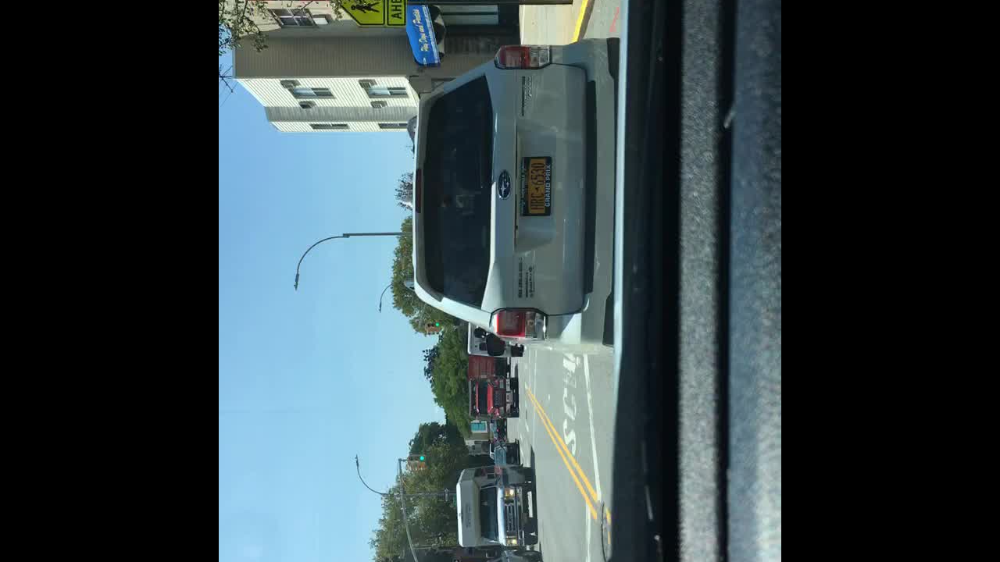

In [25]:
# rotate
rotate = cv2.getRotationMatrix2D(center, 90, 1.0)
rotated = cv2.warpAffine(img, rotate,(width, height))
cv2_imshow(rotated)

In [29]:
X = 250 #@param {type: "slider", min: 0, max: 1280, step:1}
Y = 68 #@param {type: "slider", min: 0, max: 720, step: 1}
SIZE = 500 #@param {type: "slider", min: 0, max: 1250, step: 1}

In [30]:
# resize
ratio = SIZE / width
dimension = (SIZE, int(height*ratio)) # dsize=  width, height
resized = cv2.resize(img, dimension, interpolation=cv2.INTER_AREA)

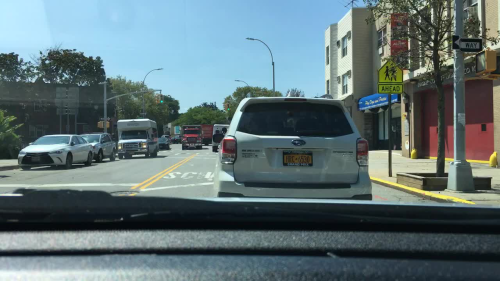

In [31]:
cv2_imshow(resized)

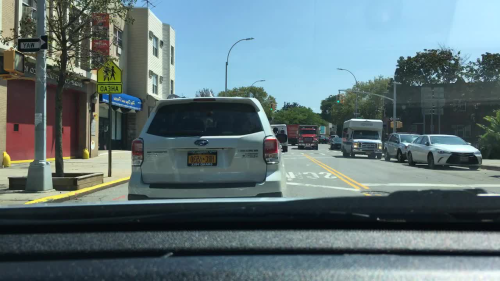

In [32]:
# flip
# Horizontal: 1, Vertical: 0, Both: -1
flipped = cv2.flip(resized, 1)
cv2_imshow(flipped)

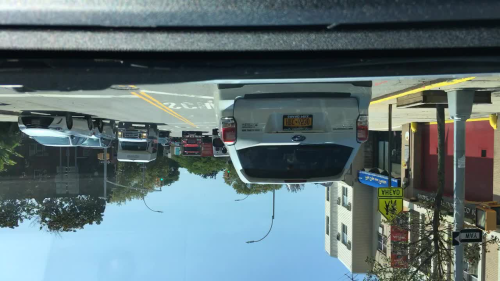

In [33]:
flipped = cv2.flip(resized, 0)
cv2_imshow(flipped)

# Lecture 5
* image masking

In [1]:
from google.colab import files
uploaded_file = files.upload()

Saving car1.jpg to car1.jpg


In [2]:
!ls -al

total 96
drwxr-xr-x 1 root root  4096 Jan  6 03:05 .
drwxr-xr-x 1 root root  4096 Jan  6 03:03 ..
-rw-r--r-- 1 root root 77963 Jan  6 03:05 car1.jpg
drwxr-xr-x 4 root root  4096 Dec 23 14:32 .config
drwxr-xr-x 1 root root  4096 Dec 23 14:32 sample_data


In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow
img = cv2.imread('car1.jpg')

In [21]:
height, width = img.shape[:2]
center = (width//2,height//2) # col, row

In [31]:
X = 150 #@param {type: "slider", min: 0, max: 1280, step:1}
Y = 150 #@param {type: "slider", min: 0, max: 720, step: 1}
SIZE = 100 #@param {type: "slider", min: 0, max: 1250, step: 1}

In [32]:
img[Y:Y+SIZE, X:X+SIZE] = (0,0,255)

In [ ]:
# rectangle
cv2.rectangle(img, (X+SIZE*2, Y), (X+SIZE*3, Y+SIZE), (0,255,0),5)
# circle
radius = int(SIZE/2)
cv2.circle(img,(X+SIZE*4, Y+radius),radius, (0,255,255),-1)
# line
cv2.line(img, (X+SIZE*5, Y), (X+SIZE*6, Y+SIZE), (0,255,255), 5)
# text
cv2.putText(img, 'creApple', (X+SIZE*7, Y+SIZE), cv2.FONT_HERSHEY_COMPLEX, 1, (255,0,0))

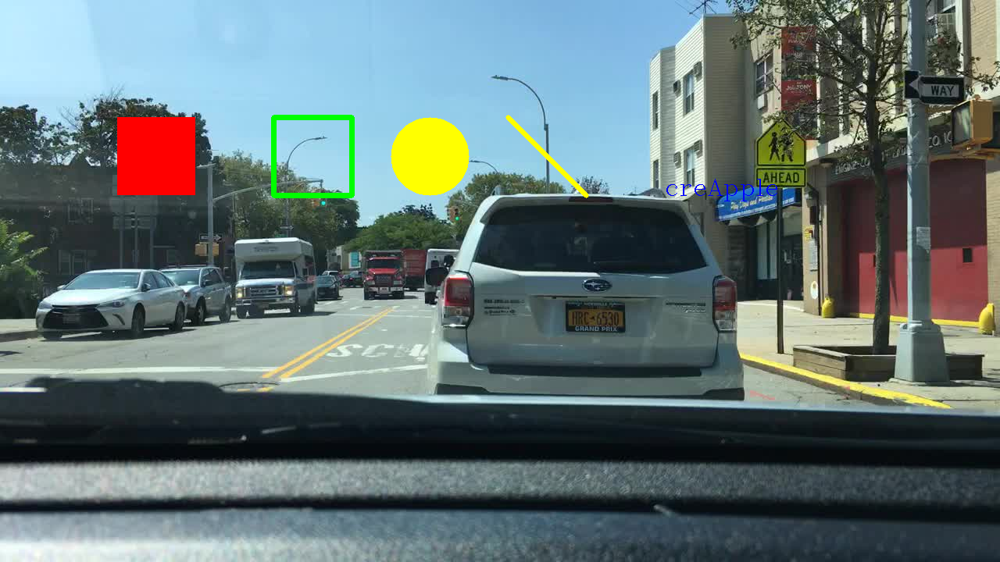

In [35]:
cv2_imshow(img)

In [27]:
# translation
move = np.float32([[1,0,100],[0,1,100]])
moved = cv2.warpAffine(img, move, (width, height))

# resize
ratio = 1/10
resized = cv2.resize(img, (int(width*ratio), int(height*ratio)),interpolation=cv2.INTER_AREA)

# rotation
rotate = cv2.getRotationMatrix2D(center, 90, 1) 
rotated = cv2.warpAffine(img, rotate,(width, height))

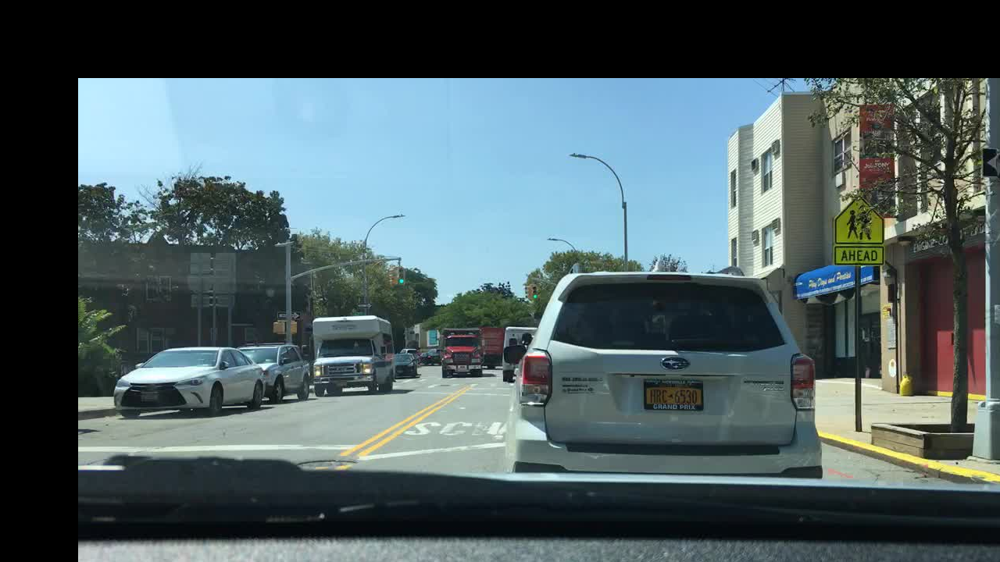

In [18]:
cv2_imshow(moved)

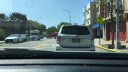

In [28]:
cv2_imshow(resized)

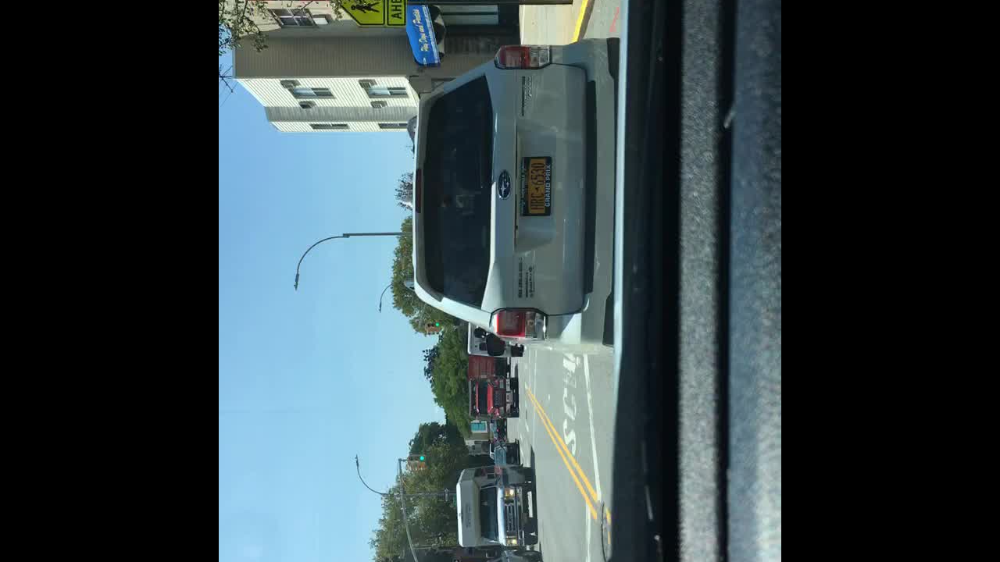

In [29]:
cv2_imshow(rotated)

# 그림그리기

In [56]:
background = np.full((height, width,3), 255, np.uint8)

In [46]:
X = 150 #@param {type: "slider", min: 0, max: 1280, step:1}
Y = 150 #@param {type: "slider", min: 0, max: 720, step: 1}
SIZE = 100 #@param {type: "slider", min: 0, max: 1250, step: 1}

In [57]:
background.shape

(720, 1280, 3)

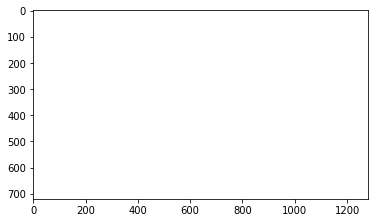

In [58]:
plt.imshow(background)

In [ ]:
# rectangle
cv2.rectangle(background, (X+SIZE*2, Y), (X+SIZE*3, Y+SIZE), (255,0,0),5) # RGB
# circle
radius = int(SIZE/2)
cv2.circle(background,(X+SIZE*4, Y+radius),radius, (0,255,255),-1)
# line
cv2.line(background, (X+SIZE*5, Y), (X+SIZE*6, Y+SIZE), (0,255,255), 5)
# # text
cv2.putText(background, 'creApple', (X+SIZE*7, Y+SIZE), cv2.FONT_HERSHEY_COMPLEX, 1, (255,0,0))

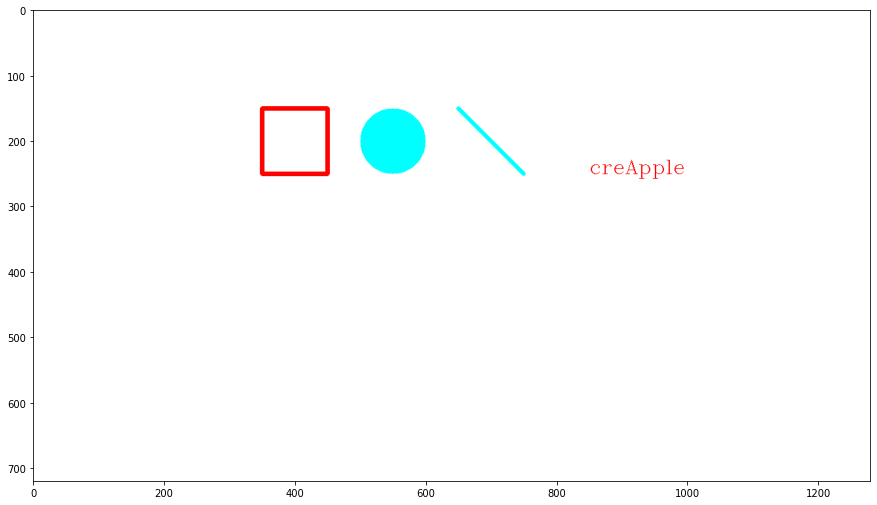

In [60]:
plt.figure(figsize=(15,15))
plt.imshow(background)

In [61]:
cv2.imwrite('./plt-copy.jpg',background)

True

In [62]:
!ls -al

total 124
drwxr-xr-x 1 root root  4096 Jan  6 04:32 .
drwxr-xr-x 1 root root  4096 Jan  6 03:03 ..
-rw-r--r-- 1 root root 77963 Jan  6 03:05 car1.jpg
drwxr-xr-x 4 root root  4096 Dec 23 14:32 .config
-rw-r--r-- 1 root root 26407 Jan  6 04:32 plt-copy.jpg
drwxr-xr-x 1 root root  4096 Dec 23 14:32 sample_data


In [63]:
import os

In [68]:
def download(path):
    try:
        from google.colab import files
        files.download(path)
    except:
        import os
        print('Download failed: ', os.path.join(os.getcwd(),path))

In [69]:
download('plt-copy.jpg')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Mask

In [81]:
# background = np.full((height, width, 3),255, np.uint8)
# mask = np.full(img.shape[:2],255,dtype='uint8') # white background
mask = np.zeros(img.shape[:2], dtype='uint8') # black background

In [82]:
radius = (mask.shape[0]//2)
cv2.circle(mask, center, radius, (255,255,255), -1)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

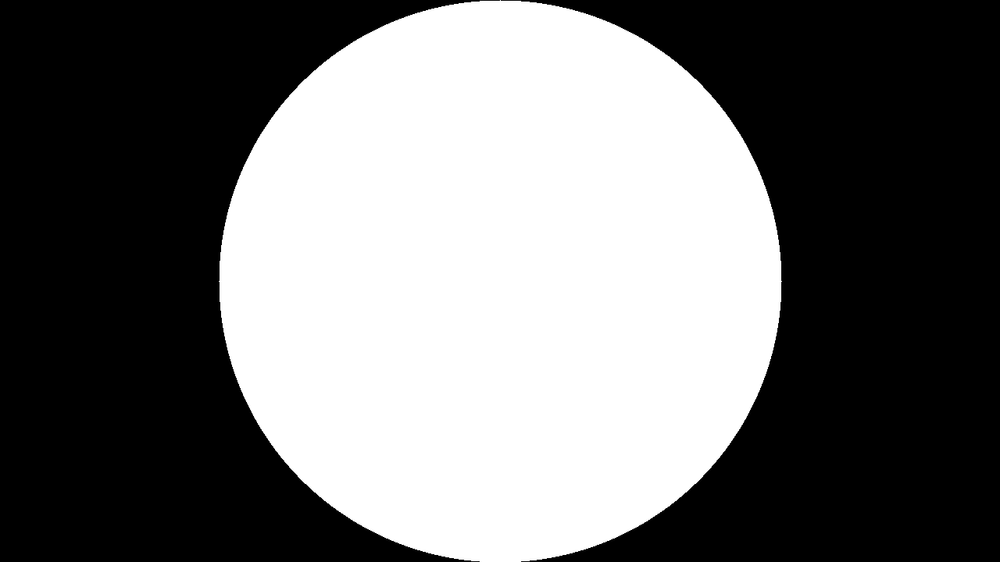

In [83]:
cv2_imshow(mask)

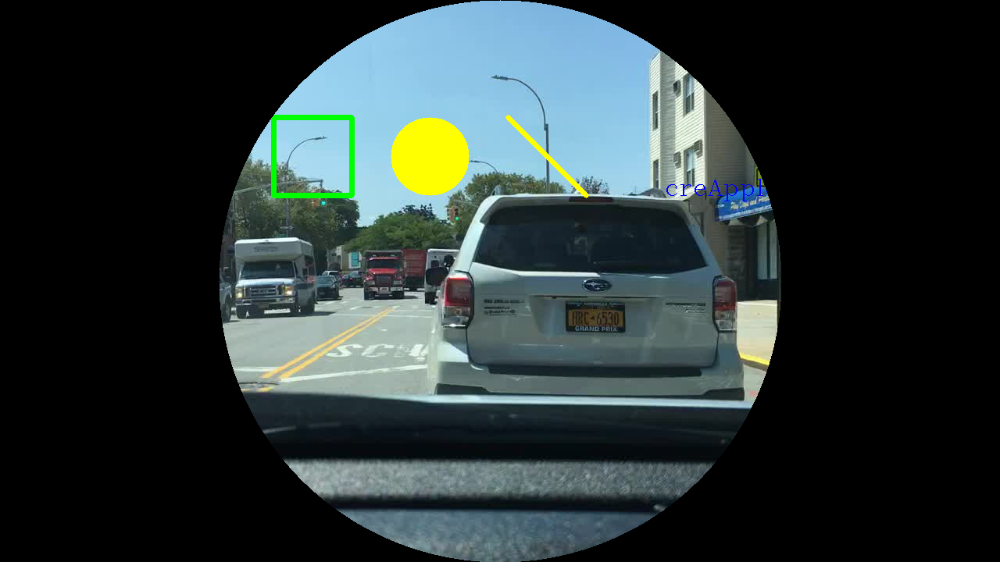

In [84]:
# masked
masked = cv2.bitwise_and(img, img, mask= mask)
cv2_imshow(masked) 
# white에 해당하는 부분만 imge 출력.

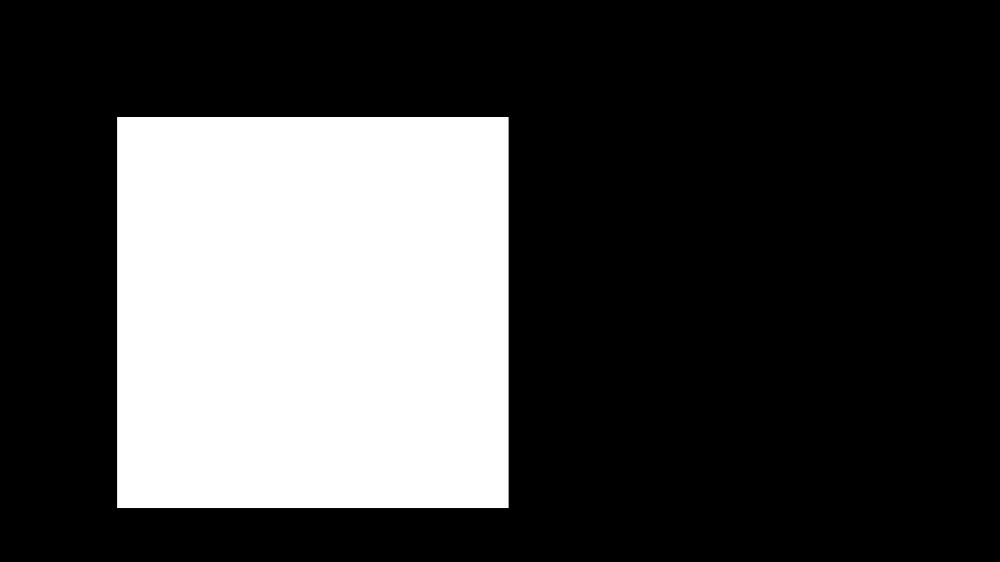

In [88]:
# 연습
mask = np.zeros(img.shape[:2], np.uint8)
cv2.rectangle(mask, (X,Y),(X+5*SIZE, Y+5*SIZE), (255,255,255), -1)
cv2_imshow(mask)

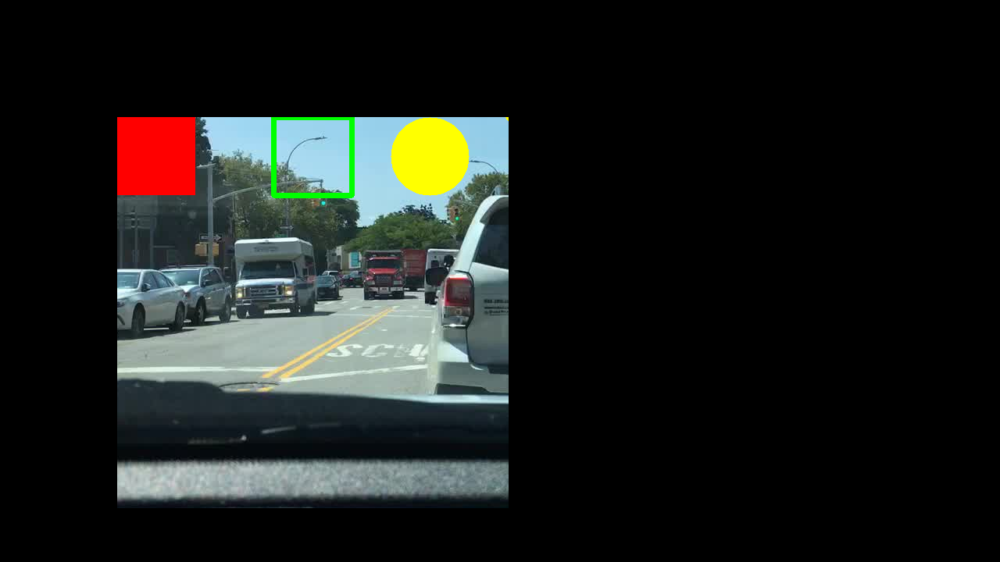

In [89]:
masked = cv2.bitwise_and(img, img, mask=mask)
cv2_imshow(masked)